## Import Libraries

Because we need a particular opencv version for CMAKE

In [ ]:
!pip uninstall opencv-contrib-python
!pip uninstall open-cv

In [ ]:
!pip install opencv-contrib-python==3.4.2.17
!pip install --upgrade imutils

     |████████████████████████████████| 30.6MB 154kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30
Requirement already up-to-date: imutils in /usr/local/lib/python3.6/dist-packages (0.5.3)


**Important Libraries**

In [ ]:
import cv2
import numpy as np
import imutils
import matplotlib.pyplot as plt
from random import randrange
from google.colab.patches import cv2_imshow
import sys
import time
import os
import tqdm
from moviepy.editor import ImageSequenceClip

# For 24->8bit
from PIL import Image

%matplotlib inline

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)851968/45929032 bytes (1.9%)2433024/45929032 bytes (5.3%)4849664/45929032 bytes (10.6%)8216576/45929032 bytes (17.9%)11714560/45929032 bytes (25.5%)15327232/45929032 bytes (33.4%)19005440/45929032 bytes (41.4%)22765568/45929032 bytes (49.6%)26214400/45929032 bytes (57.1%)29900800/45929032 bytes (65.1%)33497088/45929032 bytes (72.9%)37183488/45929032 bytes (81.0%)40919

## Stitching Images

In [ ]:
frame = 90
img1 = cv2.imread(f'/content/drive/Shared drives/drive 4/Carla Dataset/Images/Left/{frame}.png')
# img1 = cv2.imread('/content/Left.png')
img1 = img1.astype('uint8')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread(f'/content/drive/Shared drives/drive 4/Carla Dataset/Images/Front/{frame}.png')
# img2 = cv2.imread('/content/Front.png')
img2 = img2.astype('uint8')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread(f'/content/drive/Shared drives/drive 4/Carla Dataset/Images/Right/{frame}.png')
# img3 = cv2.imread('/content/Right.png')
img3 = img3.astype('uint8')
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

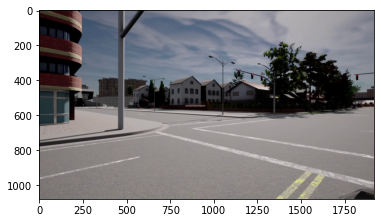

In [ ]:
# Checking the images
plt.imshow(img1)

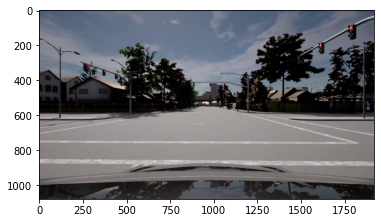

In [ ]:
# Checking the left
plt.imshow(img2)

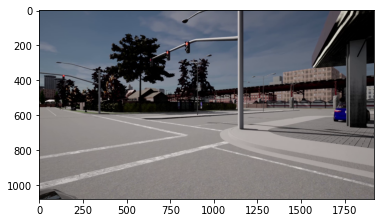

In [ ]:
# Checking the right
plt.imshow(img3)

#### Cylindrical Warping

In [ ]:
def cylindricalWarp(img, K):
    """This function returns the cylindrical warp for a given image and intrinsics matrix K"""
    h_,w_ = img.shape[:2]
    # pixel coordinates
    y_i, x_i = np.indices((h_,w_))
    X = np.stack([x_i,y_i,np.ones_like(x_i)],axis=-1).reshape(h_*w_,3) # to homog
    Kinv = np.linalg.inv(K) 
    X = Kinv.dot(X.T).T # normalized coords

    # calculate cylindrical coords (sin\theta, h, cos\theta)
    A = np.stack([np.sin(X[:,0]),X[:,1],np.cos(X[:,0])],axis=-1).reshape(w_*h_,3)
    B = K.dot(A.T).T # project back to image-pixels plane
    
    # back from homog coords
    B = B[:,:-1] / B[:,[-1]]
    
    # make sure warp coords only within image bounds
    B[(B[:,0] < 0) | (B[:,0] >= w_) | (B[:,1] < 0) | (B[:,1] >= h_)] = -1
    B = B.reshape(h_,w_,-1)
    
    # for transparent borders...
    img_rgba = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) 
    
    # warp the image according to cylindrical coords
    return cv2.remap(img_rgba, B[:,:,0].astype(np.float32), B[:,:,1].astype(np.float32), cv2.INTER_AREA, borderMode=cv2.BORDER_DEFAULT)

**Preprocessing**

In [ ]:
h, w = img1.shape[:2]
K = np.array([[800,0,w/2],[0,800,h/2],[0,0,1]]) # mock intrinsics

In [ ]:
# Applying the warping

img_cyl1 = cylindricalWarp(img1, K)
img_cyl2 = cylindricalWarp(img2, K)
# img_cyl2 = img2.copy()
img_cyl3 = cylindricalWarp(img3, K)

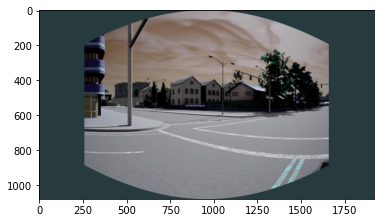

In [ ]:
plt.imshow(img_cyl1)

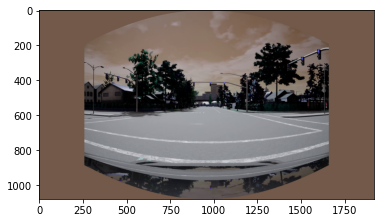

In [ ]:
plt.imshow(img_cyl2)

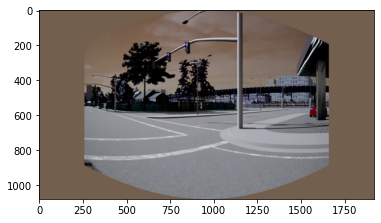

In [ ]:
plt.imshow(img_cyl3)

### Trial

Importing the images


#### Trim Function (Optional)]

In [ ]:
# To crop the black part of the stitched image

def trim(frame):
  # Cropping the top
  if not np.sum(frame[0]):
    return trim(frame[1:])

  if not np.sum(frame[-1]):
    return trim(frame[:-2])

  if not np.sum(frame[:, 0]):
    return trim(frame[:, 1:])

  if not np.sum(frame[:, -1]):
    return trim(frame[:, :-2])

  return frame

#### Trim for cylindrical

In [ ]:
def trim_cyl(img):
  return img[:, 260:1650]

In [ ]:
img_cyl1_crop = trim_cyl(img_cyl1)
img_cyl2_crop = trim_cyl(img_cyl2)
# img_cyl2_crop = img_cyl2.copy()
img_cyl3_crop = trim_cyl(img_cyl3)

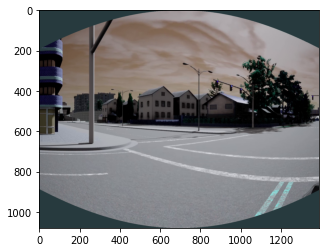

In [ ]:
plt.imshow(img_cyl1_crop)

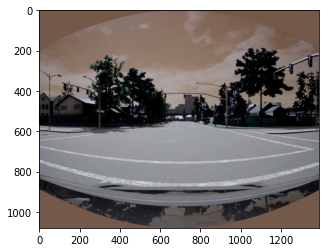

In [ ]:
plt.imshow(img_cyl2_crop)

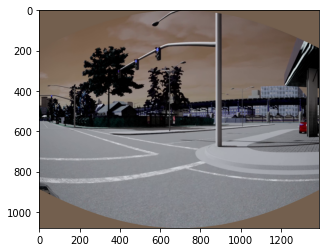

In [ ]:
plt.imshow(img_cyl3_crop)

#### Whole code (Function)

In [ ]:
def stitch(img_1, img_2):
  # img2 = cv2.imread('/content/Screenshot 2020-11-03 112809.png')
  # img3 = cv2.imread('/content/Screenshot 2020-11-03 112821.png')
  
  # img = cv2.cvtColor(img_1,cv2.COLOR_BGR2GRAY)
  # img = cv2.resize(img, (1024, 683))
  # imgm = cv2.cvtColor(img_2,cv2.COLOR_BGR2GRAY)
  # imgm = cv2.resize(imgm, (1024, 683))
  img = img_1.copy()
  imgm = img_2.copy()

  sift = cv2.xfeatures2d.SIFT_create()
  
  # Find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(imgm,None)
  kp2, des2 = sift.detectAndCompute(img,None)

  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1,des2, k=2)

  # Apply ratio test
  good = []
  alpha = 0.5
  for m in matches:
      if m[0].distance < alpha*m[1].distance:
          good.append(m)
  matches = np.asarray(good)

  if len(matches[:,0]) >= 7:
      src = np.float32([ kp1[m.queryIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
      dst = np.float32([ kp2[m.trainIdx].pt for m in matches[:,0] ]).reshape(-1,1,2)
      H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
      
      '''
      Optional
      '''
      # Getting the dimensions of the image (To be used soon)
      # h, w = img.shape

      # pts = np.float32([ [0,0], [0, h-1], [w-1, h-1], [w-1,0 ] ]).reshape(-1,1,2)
      # img__ = cv2.perspectiveTransform(pts, H)

      '''
      To plot a line to display the stitch boundary
      '''
      # img_ = cv2.polylines(imgm, [np.int32(img__)], True, 255, 3, cv2.LINE_AA)
      
      '''
      To print the overlapping image
      '''
      # To reduce the file size
      # plt.imshow(imgm, cmap='gray')
      # cv2_imshow(img_)

  else:
      raise AssertionError("Cannot find enough keypoints.")

  # Homography Matrix
  print(H)

  stitched = cv2.warpPerspective(imgm, H, (img.shape[1] + imgm.shape[1], img.shape[0]))
  stitched[0:img.shape[0], 0:img.shape[1]] = img

  stitched = cv2.cvtColor(stitched, cv2.COLOR_BGRA2RGB)

  return stitched

**Trying the following:**
1. Left-Middle
2. Middle-Right
3. (1)+(2) - Whole 3 stitched together

**Reversing the middle and left image**

Middle


In [ ]:
img_cyl2_crop = cv2.flip(img_cyl2_crop, 1)

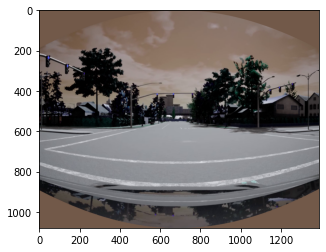

In [ ]:
plt.imshow(img_cyl2_crop)

Left

In [ ]:
img_cyl1_crop = cv2.flip(img_cyl1_crop, 1)

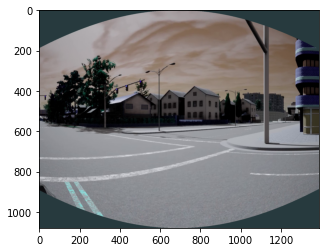

In [ ]:
plt.imshow(img_cyl1_crop)

[[ 1.63542701e+00  2.17539423e-02  7.00570101e+02]
 [ 2.27161811e-01  1.13704197e+00 -6.98978878e+01]
 [ 4.29915421e-04  8.75898939e-06  1.00000000e+00]]


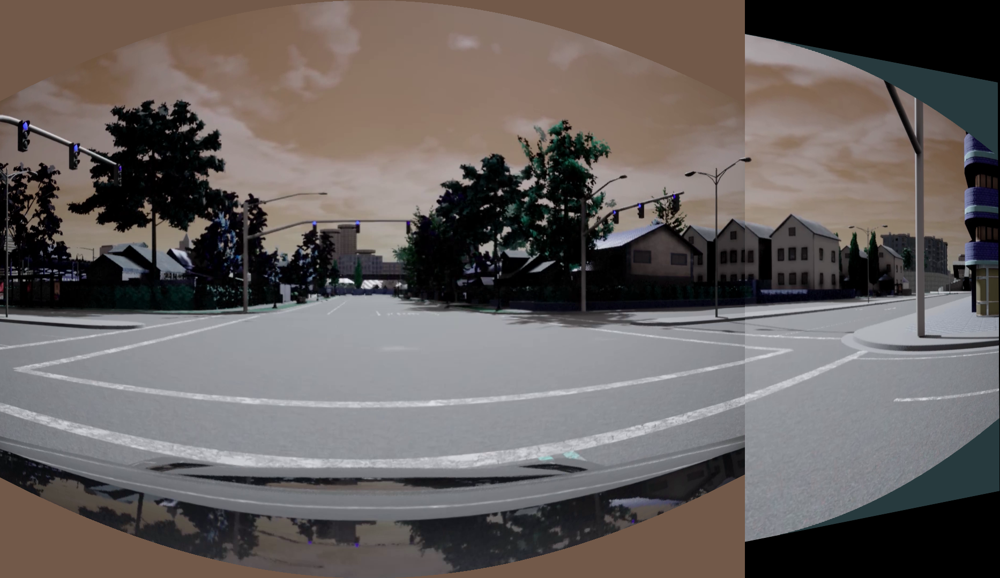

In [ ]:
lm = stitch(img_cyl2_crop, img_cyl1_crop)
lm = trim(lm)
cv2_imshow(lm)

Flipping the result

In [ ]:
lm = cv2.flip(lm, 1)

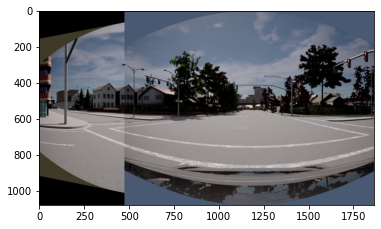

In [ ]:
plt.imshow(lm)

Flipping to get middle to original values

In [ ]:
img_cyl2_crop = cv2.flip(img_cyl2_crop, 1)

[[ 1.55327697e+00  3.25434224e-02  7.21482061e+02]
 [ 2.09305803e-01  1.14295621e+00 -6.45487359e+01]
 [ 4.04441841e-04  3.58870511e-05  1.00000000e+00]]


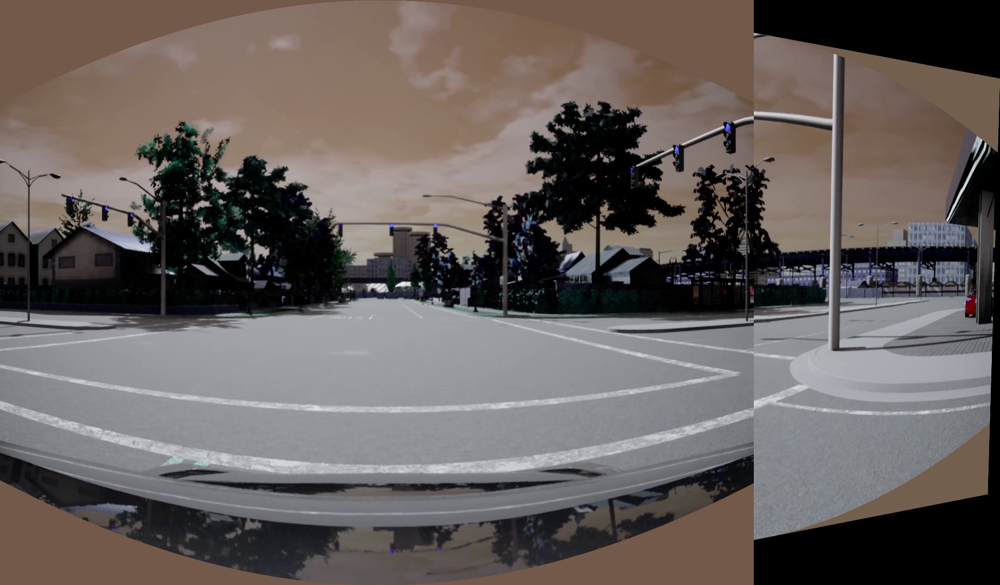

In [ ]:
mr = stitch(img_cyl2_crop, img_cyl3_crop)
mr = trim(mr)
cv2_imshow(mr)

[[ 1.00000149e+00 -5.27932149e-06  4.76003660e+02]
 [ 3.15706966e-06  1.00000829e+00 -7.17528341e-03]
 [ 2.09206685e-09 -3.42569472e-10  1.00000000e+00]]


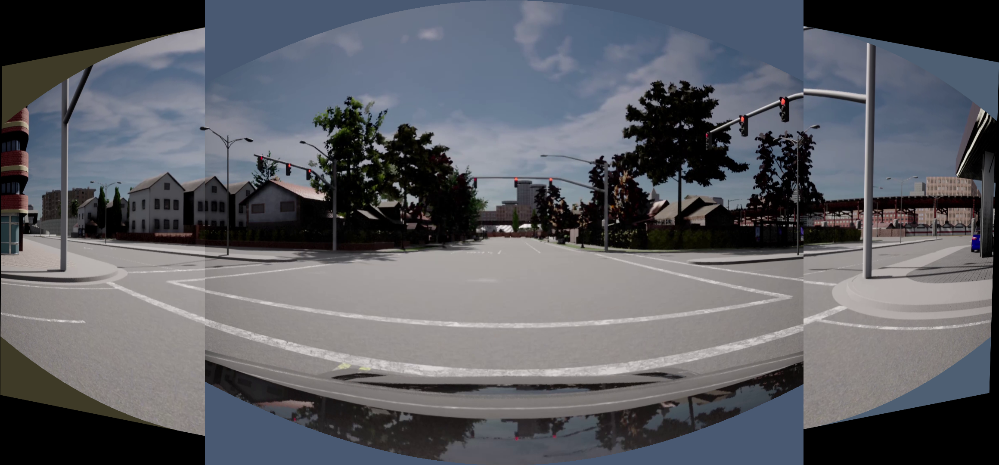

In [ ]:
final = stitch(lm, mr)
final = trim(final)
cv2_imshow(final)

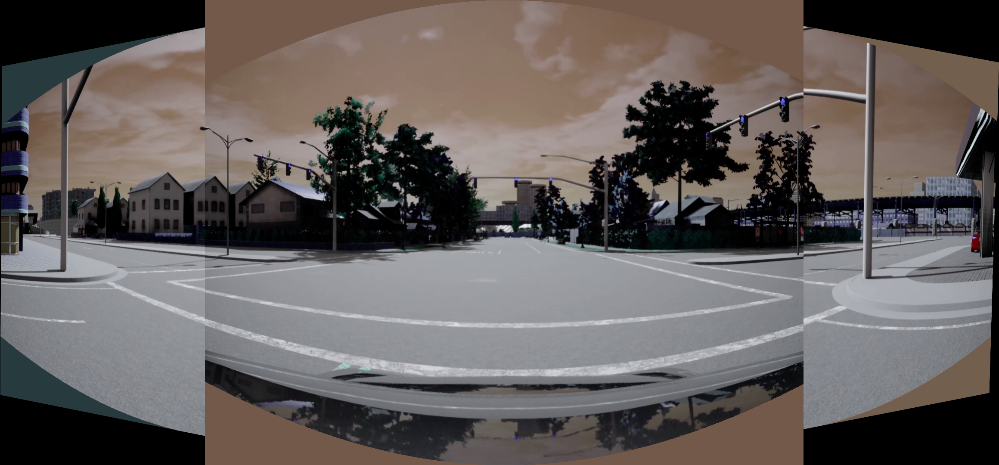

In [ ]:
final_color = cv2.cvtColor(final, cv2.COLOR_BGRA2RGB)
cv2_imshow(final_color)

#### Cropping the image

In [ ]:
stitched = final_color.copy()

Cropping...


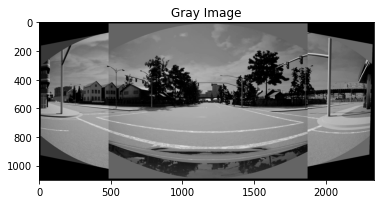

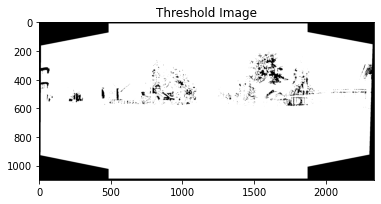

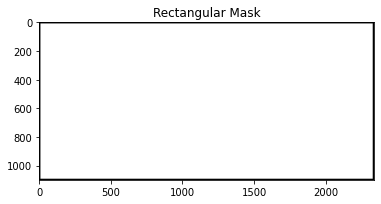

10 10 2321 1081


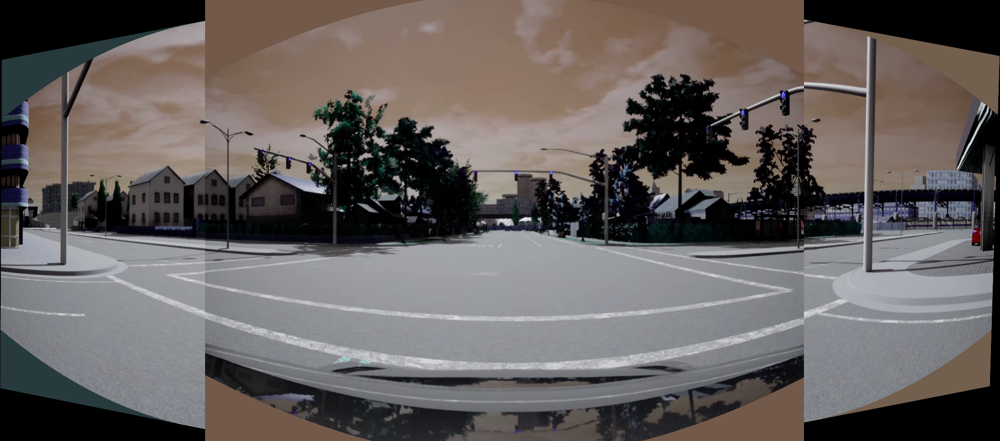

In [ ]:
# create a 10 pixel border surrounding the stitched image
print("Cropping...")
stitched = cv2.copyMakeBorder(stitched, 10, 10, 10, 10,
  cv2.BORDER_CONSTANT, (0, 0, 0))

# convert the stitched image to grayscale and threshold it
# such that all pixels greater than zero are set to 255
# (foreground) while all others remain 0 (background)
gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

# To get the intermediate results
plt.imshow(gray, cmap='gray')
plt.title("Gray Image")
plt.show()

plt.pause(0.2)

plt.imshow(thresh, cmap='gray')
plt.title("Threshold Image")
plt.show()

plt.pause(0.2)

# find all external contours in the threshold image then find
# the *largest* contour which will be the contour/outline of
# the stitched image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
  cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

# allocate memory for the mask which will contain the
# rectangular bounding box of the stitched image region
mask = np.zeros(thresh.shape, dtype="uint8")
(x, y, w, h) = cv2.boundingRect(c)
cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

h = int(0.6*h)

plt.imshow(cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1), cmap='gray')
plt.title("Rectangular Mask")
plt.show()

plt.pause(0.2)

# create two copies of the mask: one to serve as our actual
# minimum rectangular region and another to serve as a counter
# for how many pixels need to be removed to form the minimum
# rectangular region
minRect = mask.copy()

# find contours in the minimum rectangular mask and then
# extract the bounding box (x, y)-coordinates
cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL,
  cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)
(x, y, w, h) = cv2.boundingRect(c)

print(x, y, w, h)
# use the bounding box coordinates to extract the our final
# stitched image
stitched_cropped = stitched[25: 25 + 1025, x:x + w]

# Display the output stitched image to our screen
cv2_imshow(stitched_cropped)

In [ ]:
stitched_cropped.shape

(1025, 2321, 3)

In [ ]:
stitched_cropped_resized = cv2.resize(stitched_cropped, (1920, 720))

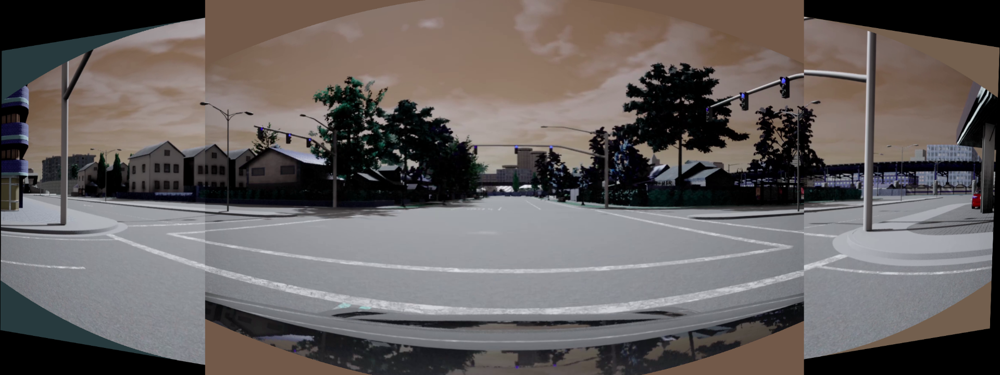

In [ ]:
cv2_imshow(stitched_cropped_resized)

### New Method

In [ ]:
import cv2
import numpy as np
import sys

class Image_Stitching():
    def __init__(self) :
        self.ratio=0.85
        self.min_match=10
        self.sift=cv2.xfeatures2d.SIFT_create()
        self.smoothing_window_size=800

    def registration(self,img1,img2):
        kp1, des1 = self.sift.detectAndCompute(img1, None)
        kp2, des2 = self.sift.detectAndCompute(img2, None)
        matcher = cv2.BFMatcher()
        raw_matches = matcher.knnMatch(des1, des2, k=2)
        good_points = []
        good_matches=[]
        for m1, m2 in raw_matches:
            if m1.distance < self.ratio * m2.distance:
                good_points.append((m1.trainIdx, m1.queryIdx))
                good_matches.append([m1])
        img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, good_matches, None, flags=2)
        cv2.imwrite('matching.jpg', img3)
        if len(good_points) > self.min_match:
            image1_kp = np.float32(
                [kp1[i].pt for (_, i) in good_points])
            image2_kp = np.float32(
                [kp2[i].pt for (i, _) in good_points])
            H, status = cv2.findHomography(image2_kp, image1_kp, cv2.RANSAC,5.0)
        return H

    def create_mask(self,img1,img2,version):
        height_img1 = img1.shape[0]
        width_img1 = img1.shape[1]
        width_img2 = img2.shape[1]
        height_panorama = height_img1
        width_panorama = width_img1 +width_img2
        offset = int(self.smoothing_window_size / 2)
        barrier = img1.shape[1] - int(self.smoothing_window_size / 2)
        mask = np.zeros((height_panorama, width_panorama))
        if version== 'left_image':
            mask[:, barrier - offset:barrier + offset ] = np.tile(np.linspace(1, 0, 2 * offset ).T, (height_panorama, 1))
            mask[:, :barrier - offset] = 1
        else:
            mask[:, barrier - offset :barrier + offset ] = np.tile(np.linspace(0, 1, 2 * offset ).T, (height_panorama, 1))
            mask[:, barrier + offset:] = 1
        return cv2.merge([mask, mask, mask])

    def blending(self,img1,img2):
        H = self.registration(img1,img2)
        height_img1 = img1.shape[0]
        width_img1 = img1.shape[1]
        width_img2 = img2.shape[1]
        height_panorama = height_img1
        width_panorama = width_img1 +width_img2

        panorama1 = np.zeros((height_panorama, width_panorama, 3))
        mask1 = self.create_mask(img1,img2,version='left_image')
        panorama1[0:img1.shape[0], 0:img1.shape[1], :] = img1
        panorama1 *= mask1
        mask2 = self.create_mask(img1,img2,version='right_image')
        panorama2 = cv2.warpPerspective(img2, H, (width_panorama, height_panorama))*mask2
        result=panorama1+panorama2

        rows, cols = np.where(result[:, :, 0] != 0)
        min_row, max_row = min(rows), max(rows) + 1
        min_col, max_col = min(cols), max(cols) + 1
        final_result = result[min_row:max_row, min_col:max_col, :]
        return final_result

In [ ]:
def main(img1, img2):
    final=Image_Stitching().blending(img1,img2)
    return final

In [ ]:
img_final = main(img_cyl1, img_cyl2)

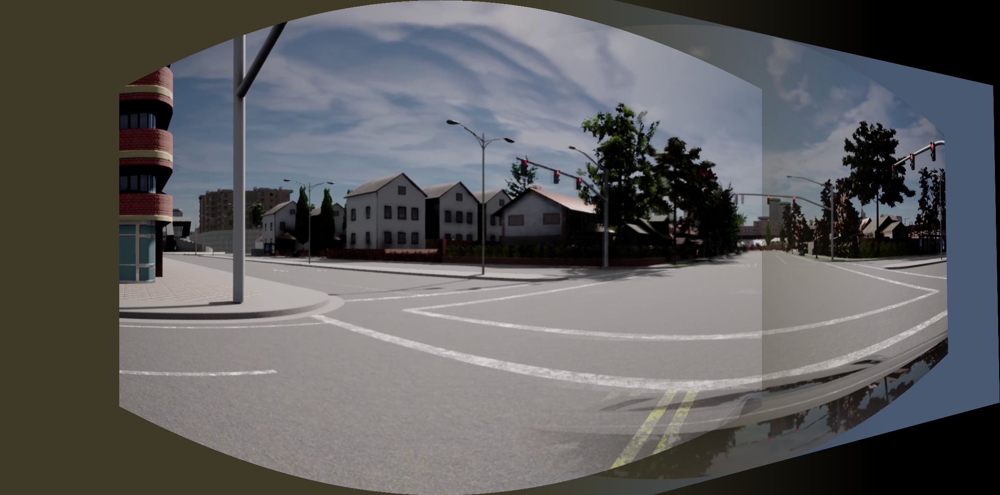

In [ ]:
cv2_imshow(img_final)

In [ ]:
lm = main(img_cyl1, cv2.flip(img_cyl2, 1))

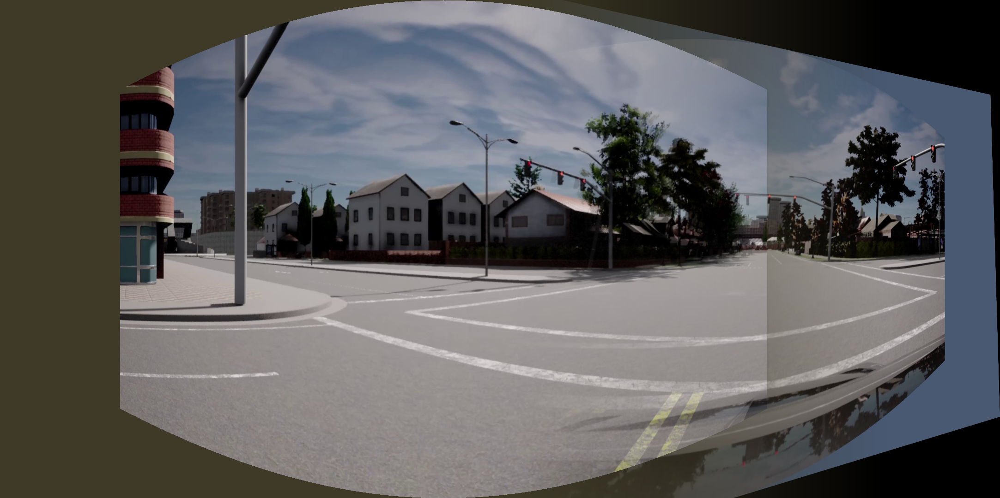

In [ ]:
cv2_imshow(lm)

In [ ]:
mr = main(img_cyl2, img_cyl3)

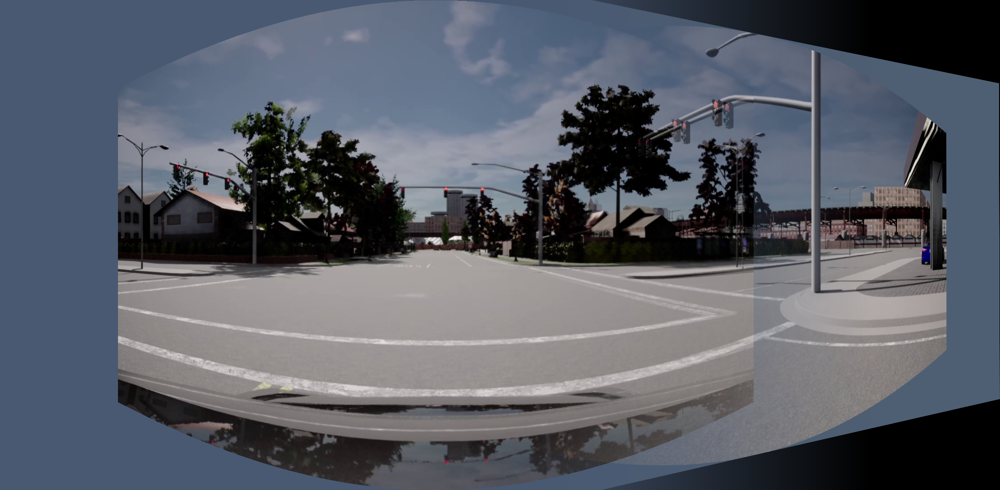

In [ ]:
cv2_imshow(mr)